## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.


### Imports

In [1]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

### Camera Calibration

#### 1. Briefly state how you computed the camera matrix and distortion coefficients. Provide an example of a distortion corrected calibration image.

In the function undistort_init() I start by preparing "object points", which will be the (x, y, z) coordinates of the chessboard corners in the world. Here I am assuming the chessboard is fixed on the (x, y) plane at z=0, such that the object points are the same for each calibration image.  Thus, `objp` is just a replicated array of coordinates, and `objpoints` will be appended with a copy of it every time I successfully detect all chessboard corners in a test image.  `imgpoints` will be appended with the (x, y) pixel position of each of the corners in the image plane with each successful chessboard detection.  

I then used the output `objpoints` and `imgpoints` to compute the camera calibration and distortion coefficients using the `cv2.calibrateCamera()` function.  

I then use the result as an input for the undistort() function, which corrects the distortion of the given test image using the `cv2.undistort()` function with the following result: 

In [2]:
def undistort_init():
    chessboard_images = os.listdir("camera_cal/")

    # Chessboard corners in x and y direction
    nx = 9
    ny = 6

    obj_points = []
    img_points = []

    obj_p = np.zeros((nx * ny, 3), np.float32)
    obj_p[:, :2] = np.mgrid[0: nx, 0: ny].T.reshape(-1, 2)

    # Find chessboard corners
    for image_file in chessboard_images: 
        image = cv2.imread(os.path.join("camera_cal", image_file))  
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
        if ret:
            cv2.drawChessboardCorners(image, (nx, ny), corners, ret)
            img_points.append(corners)
            obj_points.append(obj_p)

    # Calibrate and undistort the camera
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(obj_points, img_points, gray.shape[::-1],None,None)
    
    return ret, mtx, dist, rvecs, tvecs

def undistort(test_image, ret, mtx, dist, rvecs, tvecs):
    undist = cv2.undistort(test_image, mtx, dist, None, mtx)
    return undist
    

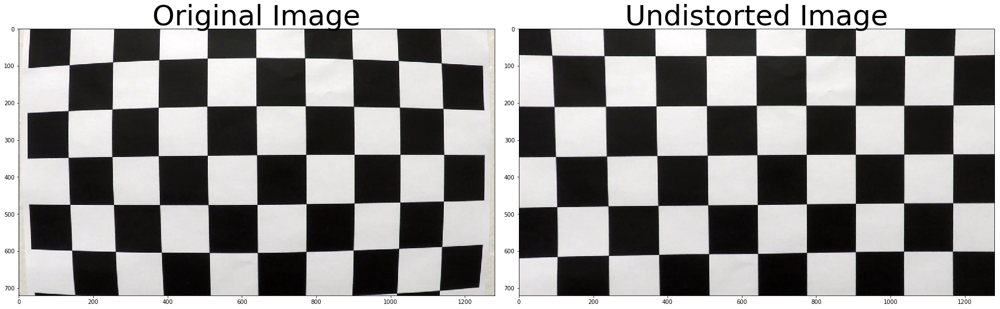

In [3]:
# Undistort camera
image = cv2.imread('camera_cal/calibration1.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
ret, mtx, dist, rvecs, tvecs = undistort_init()
undist = undistort(image, ret, mtx, dist, rvecs, tvecs)
    
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undist)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

### Pipeline (single images)

#### 1. Provide an example of a distortion-corrected image.

To demonstrate this step, I will describe how I apply the distortion correction to one of the test images like this one:

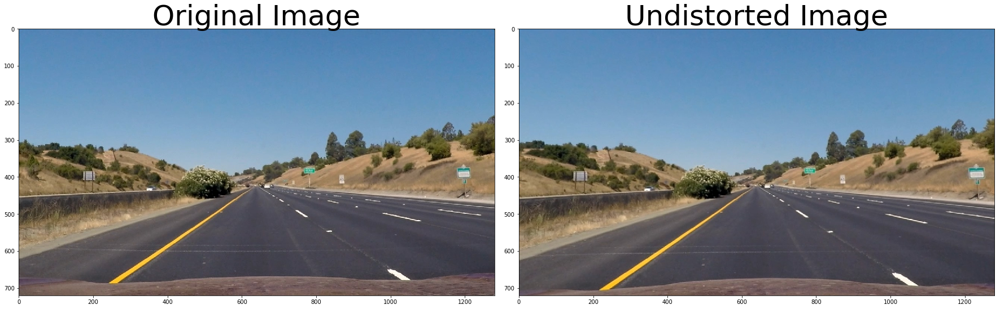

In [4]:
# Calibrate and undistort the camera
image = cv2.imread("test_images/straight_lines1.jpg") 
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
ret, mtx, dist, rvecs, tvecs = undistort_init()
undist = undistort(image, ret, mtx, dist, rvecs, tvecs)

# Show the result on one image
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undist)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


#### 2. Describe how (and identify where in your code) you used color transforms, gradients or other methods to create a thresholded binary image.  Provide an example of a binary image result.




In [206]:
# Define a function that takes an image, gradient orientation,
# and threshold min / max values.
def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    # Return the result
    return binary_output

# Define a function to return the magnitude of the gradient
# for a given sobel kernel size and threshold values
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output


# Define a function to threshold an image for a given range and Sobel kernel
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

def hls_select(img, thresh=(0, 255)):    
    img = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    gray = img[:,:,2]        
    binary_output = np.zeros_like(gray)
    binary_output[(gray > thresh[0]) & (gray <= thresh[1])] = 1
    return binary_output

def hsv_select(img, thresh=(0, 255)):
    img = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    gray = img[:,:,2]        
    binary_output = np.zeros_like(gray)
    binary_output[(gray > thresh[0]) & (gray <= thresh[1])] = 1
    return binary_output

In [228]:
image = cv2.imread("test_images/test5.jpg") 
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
ret, mtx, dist, rvecs, tvecs = undistort_init()
undist = undistort(image, ret, mtx, dist, rvecs, tvecs)


saturation = hls_select(undist, thresh=(130, 255))
value = hsv_select(undist, thresh=(210, 255))
abs_sobel_x = abs_sobel_thresh(value, orient='x', thresh_min=20, thresh_max=80)
abs_sobel_y = abs_sobel_thresh(value, orient='y', thresh_min=20, thresh_max=255)
mag_sobel = mag_thresh(value, sobel_kernel=15, mag_thresh=(30, 100))
dir_sobel = dir_threshold(value, sobel_kernel=3, thresh=(0.7, 1.3))

combined = np.zeros_like(abs_sobel_x)
# combined[(((abs_sobel_x == 1) & (abs_sobel_y == 1)))] = 1 
# combined[(((mag_sobel == 1) & (dir_sobel == 1)))] = 1 
combined[(value > 0) | ((((abs_sobel_x == 1) & (abs_sobel_y == 1))) | (((mag_sobel == 1) & (dir_sobel == 1))))] = 1

f, ((ax1, ax2, ax3, ax4), (ax5, ax6, ax7, ax8))= plt.subplots(2, 4, figsize=(24, 9))
font_size = 24

ax1.imshow(abs_sobel_x, cmap='gray')
ax2.imshow(abs_sobel_y, cmap='gray')
ax3.imshow(mag_sobel, cmap='gray')
ax4.imshow(dir_sobel, cmap='gray')
ax5.imshow(saturation, cmap='gray')
ax6.imshow(value, cmap='gray')
ax7.imshow(combined, cmap='gray')
ax8.imshow(undist)
plt.show()

error: OpenCV(3.4.4) /io/opencv/modules/imgproc/src/color.hpp:255: error: (-2:Unspecified error) in function 'cv::CvtHelper<VScn, VDcn, VDepth, sizePolicy>::CvtHelper(cv::InputArray, cv::OutputArray, int) [with VScn = cv::Set<3, 4>; VDcn = cv::Set<1>; VDepth = cv::Set<0, 2, 5>; cv::SizePolicy sizePolicy = (cv::SizePolicy)2u; cv::InputArray = const cv::_InputArray&; cv::OutputArray = const cv::_OutputArray&]'
> Invalid number of channels in input image:
>     'VScn::contains(scn)'
> where
>     'scn' is 1


#### 2. Describe how (and identify where in your code) you performed a perspective transform and provide an example of a transformed image.

The code for my perspective transform includes a function called `warper()`, which appears in lines 1 through 8 in the file `example.py` (output_images/examples/example.py) (or, for example, in the 3rd code cell of the IPython notebook).  The `warper()` function takes as inputs an image (`img`), as well as source (`src`) and destination (`dst`) points.  I chose the hardcode the source and destination points in the following manner:

This resulted in the following source and destination points:

| Source        | Destination   | 
|:-------------:|:-------------:| 
| 535, 491      | 400, 0        | 
| 750, 491      | 880, 0        |
| 1050, 670     | 880, 720      |
| 250, 670      | 400, 720      |

I verified that my perspective transform was working as expected by drawing the `src` and `dst` points onto a test image and its warped counterpart to verify that the lines appear parallel in the warped image.

In [159]:
def warp(image, show=False):
    h,w = image.shape[:2]
    offset = 380
    src = np.float32([(535,491),
                      (750,491),
                      (1050,670),
                      (250,670)])
    dst = np.float32([(offset,0),
                      (w-offset,0),
                      (w-offset,h),
                      (offset,h)])

    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(image, M, (w,h), flags=cv2.INTER_LINEAR)
    
    if show:
        srcx = [src[0][0],src[1][0],src[2][0],src[3][0],src[0][0]]
        srcy = [src[0][1],src[1][1],src[2][1],src[3][1],src[0][1]]
        dstx = [dst[0][0],dst[1][0],dst[2][0],dst[3][0],dst[0][0]]
        dsty = [dst[0][1],dst[1][1],dst[2][1],dst[3][1],dst[0][1]]


        # Show the result on one image
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        f.tight_layout()
        ax1.imshow(image)
        ax1.set_title('Original Image', fontsize=50)
        ax1.plot(srcx, srcy, color='#ff0000', alpha=0.9, linewidth=3, solid_capstyle='round', zorder=2)

        ax2.imshow(warped)
        ax2.set_title('Warped Image', fontsize=50)
        ax2.plot(dstx, dsty, color='#ff0000', alpha=0.9, linewidth=3, solid_capstyle='round', zorder=2)

        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    return M, Minv, warped

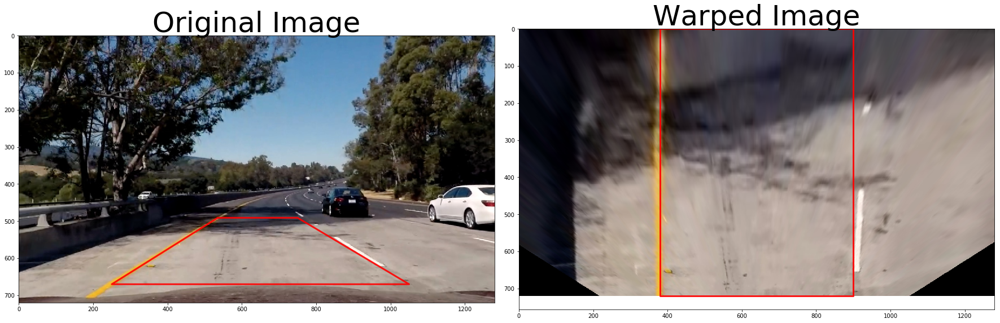

In [160]:
image = cv2.imread("test_images/test5.jpg") 
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
ret, mtx, dist, rvecs, tvecs = undistort_init()
undist = undistort(image, ret, mtx, dist, rvecs, tvecs)
M, Minv, warped = warp(undist, True)

#### 3. Describe how (and identify where in your code) you used color transforms, gradients or other methods to create a thresholded binary image.  Provide an example of a binary image result.

* I first plotted the different color channels to get a side to side comparison between the binary images.
* After that I created the functions to compute the binary image in different ways with respective thresholds, which also gave me a good intuition which functions to use for the finale binary image. 
* After changing the threshold values for the different functions I decided to combine the HSV-value with the HLS-saturation, to create the final binary image.
* I then tested this combination on all test images, with satisfying results as seen below.


In [161]:
# Define a function that takes an image, gradient orientation,
# and threshold min / max values.
def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    # Return the result
    return binary_output

# Define a function to return the magnitude of the gradient
# for a given sobel kernel size and threshold values
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output


# Define a function to threshold an image for a given range and Sobel kernel
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

def hls_select(img, color, thresh=(0, 255)):    
    img = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    
    if color == 'hue':
        gray = img[:,:,0]
    elif color == 'lightness':
        gray = img[:,:,1]
    elif color == 'saturation':
        gray = img[:,:,2]
        
    binary_output = np.zeros_like(gray)
    binary_output[(gray > thresh[0]) & (gray <= thresh[1])] = 1
    return binary_output

def hsv_select(img, color, thresh=(0, 255)):
    img = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    
    if color == 'hue':
        gray = img[:,:,0]
    elif color == 'saturation':
        gray = img[:,:,1]
    elif color == 'value':
        gray = img[:,:,2]
        
    binary_output = np.zeros_like(gray)
    binary_output[(gray > thresh[0]) & (gray <= thresh[1])] = 1
    return binary_output

In [227]:
image = cv2.imread("test_images/test5.jpg") 
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
ret, mtx, dist, rvecs, tvecs = undistort_init()
undist = undistort(image, ret, mtx, dist, rvecs, tvecs)
M, Minv, warped = warp(undist, False)


saturation = hls_select(image, 'saturation', thresh=(130, 255))
value = hsv_select(image, 'value', thresh=(210, 255))
abs_sobel_x = abs_sobel_thresh(value, orient='x', thresh_min=20, thresh_max=100)
abs_sobel_y = abs_sobel_thresh(value, orient='y', thresh_min=80, thresh_max=255)
mag_sobel = mag_thresh(value, sobel_kernel=9, mag_thresh=(30, 100))
dir_sobel = dir_threshold(value, sobel_kernel=15, thresh=(0.7, 1.3))

combined = np.zeros_like(abs_sobel_x)
combined[(saturation > 0) | (((abs_sobel_x == 1) & (abs_sobel_y == 1)) | ((mag_sobel == 1) & (dir_sobel == 1)))] = 1 

f, ((ax1, ax2, ax3), (ax4, ax5, ax6), (ax7, ax7, ax7))= plt.subplots(3, 3, figsize=(24, 9))
font_size = 24

ax1.imshow(abs_sobel_x, cmap='gray')
ax2.imshow(abs_sobel_y, cmap='gray')
ax3.imshow(mag_sobel, cmap='gray')
ax4.imshow(dir_sobel, cmap='gray')
ax5.imshow(saturation, cmap='gray')
ax6.imshow(value, cmap='gray')
ax7.imshow(combined, cmap='gray')
plt.show()

TypeError: hls_select() got multiple values for argument 'thresh'

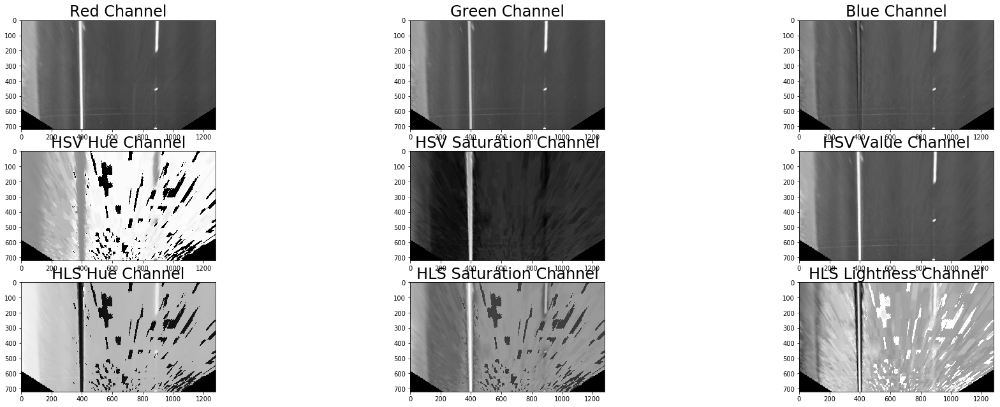

In [31]:
# Warp image
image = cv2.imread("test_images/straight_lines1.jpg") 
ret, mtx, dist, rvecs, tvecs = undistort_init()
undist = undistort(image, ret, mtx, dist, rvecs, tvecs)
M, Minv, warped = warp(undist)
warped = cv2.cvtColor(warped, cv2.COLOR_BGR2RGB)

f, ((ax1, ax2, ax3), (ax4, ax5, ax6), (ax7, ax8, ax9)) = plt.subplots(3, 3, figsize=(24, 9))
font_size = 24

ax1.imshow(warped[:,:,0], cmap='gray')
ax1.set_title('Red Channel', fontsize=font_size)

ax2.imshow(warped[:,:,1], cmap='gray')
ax2.set_title('Green Channel', fontsize=font_size)

ax3.imshow(warped[:,:,2], cmap='gray')
ax3.set_title('Blue Channel', fontsize=font_size)


warped = cv2.cvtColor(warped, cv2.COLOR_BGR2HSV)

ax4.imshow(warped[:,:,0], cmap='gray')
ax4.set_title('HSV Hue Channel', fontsize=font_size)

ax5.imshow(warped[:,:,1], cmap='gray')
ax5.set_title('HSV Saturation Channel', fontsize=font_size)

ax6.imshow(warped[:,:,2], cmap='gray')
ax6.set_title('HSV Value Channel', fontsize=font_size)


warped = cv2.cvtColor(warped, cv2.COLOR_BGR2HLS)

ax7.imshow(warped[:,:,0], cmap='gray')
ax7.set_title('HLS Hue Channel', fontsize=font_size)

ax8.imshow(warped[:,:,1], cmap='gray')
ax8.set_title('HLS Saturation Channel', fontsize=font_size)

ax9.imshow(warped[:,:,2], cmap='gray')
ax9.set_title('HLS Lightness Channel', fontsize=font_size)


plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


In [32]:
def abs_sobel_thresh(img, color='red', orient='x', thresh_min=0, thresh_max=255):
    if color == 'red':
        gray = img[:,:,0]
    elif color == 'green':
        gray = img[:,:,1]
    elif color == 'blue':
        gray = img[:,:,2]
        
    sobel = cv2.Sobel(gray, cv2.CV_64F, orient=='x', orient=='y')
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    return sxbinary


def mag_thresh(img, color, sobel_kernel=3, mag_thresh=(0, 255)):
    if color == 'red':
        gray = img[:,:,0]
    elif color == 'green':
        gray = img[:,:,1]
    elif color == 'blue':
        gray = img[:,:,2]
        
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    mag_sobel = np.sqrt(np.square(sobelx) + np.square(sobely))
    scaled_sobel = np.uint8(255*mag_sobel/np.max(mag_sobel))
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1
    return sxbinary

def dir_threshold(img, color, sobel_kernel=3, thresh=(0, np.pi/2)):
    if color == 'red':
        gray = img[:,:,0]
    elif color == 'green':
        gray = img[:,:,1]
    elif color == 'blue':
        gray = img[:,:,2]
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    grad_dir = np.arctan2(abs_sobely, abs_sobelx)
    binary_output =  np.zeros_like(grad_dir)
    binary_output[(grad_dir >= thresh[0]) & (grad_dir <= thresh[1])] = 1
    return binary_output

def hls_select(img, color, thresh=(0, 255)):    
    img = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    
    if color == 'hue':
        gray = img[:,:,0]
    elif color == 'lightness':
        gray = img[:,:,1]
    elif color == 'saturation':
        gray = img[:,:,2]
        
    binary_output = np.zeros_like(gray)
    binary_output[(gray > thresh[0]) & (gray <= thresh[1])] = 1
    return binary_output

def hsv_select(img, color, thresh=(0, 255)):
    img = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    
    if color == 'hue':
        gray = img[:,:,0]
    elif color == 'saturation':
        gray = img[:,:,1]
    elif color == 'value':
        gray = img[:,:,2]
        
    binary_output = np.zeros_like(gray)
    binary_output[(gray > thresh[0]) & (gray <= thresh[1])] = 1
    return binary_output

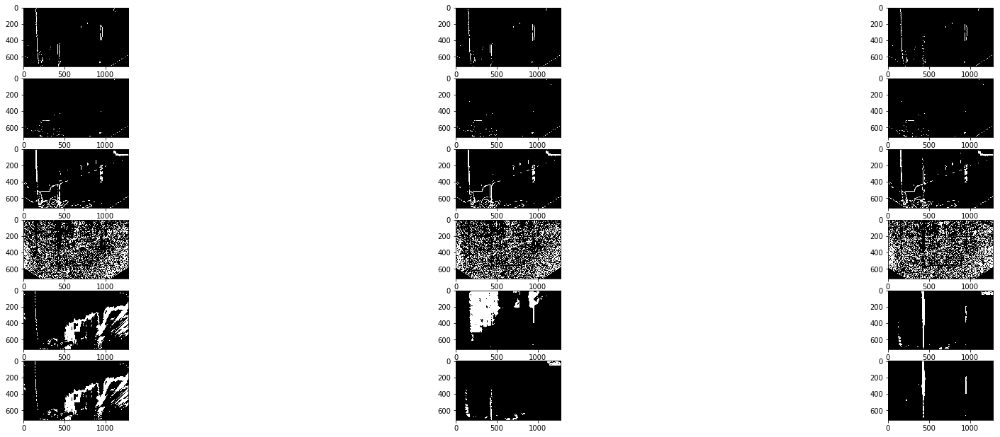

In [77]:
image = cv2.imread("test_images/test4.jpg") 
ret, mtx, dist, rvecs, tvecs = undistort_init()
undist = undistort(image, ret, mtx, dist, rvecs, tvecs)
M, Minv, warped = warp(undist)
warped = cv2.cvtColor(warped, cv2.COLOR_BGR2RGB)


grad_binary_x_red = abs_sobel_thresh(warped, 'red', orient='x', thresh_min=30, thresh_max=255)
grad_binary_x_green = abs_sobel_thresh(warped, 'green', orient='x', thresh_min=30, thresh_max=255)
grad_binary_x_blue = abs_sobel_thresh(warped, 'blue', orient='x', thresh_min=30, thresh_max=255)

grad_binary_y_red = abs_sobel_thresh(warped, 'red', orient='y', thresh_min=30, thresh_max=255)
grad_binary_y_green = abs_sobel_thresh(warped, 'green', orient='y', thresh_min=30, thresh_max=255)
grad_binary_y_blue = abs_sobel_thresh(warped, 'blue', orient='y', thresh_min=30, thresh_max=255)

mag_binary_red = mag_thresh(warped, 'red', sobel_kernel=15, mag_thresh=(30, 100))
mag_binary_green = mag_thresh(warped, 'green', sobel_kernel=15, mag_thresh=(30, 100))
mag_binary_blue = mag_thresh(warped, 'blue', sobel_kernel=15, mag_thresh=(30, 100))

dir_binary_red = dir_threshold(warped, 'red', sobel_kernel=5, thresh=(0.7, 1.3))
dir_binary_green = dir_threshold(warped, 'green', sobel_kernel=5, thresh=(0.7, 1.3))
dir_binary_blue = dir_threshold(warped, 'blue', sobel_kernel=3, thresh=(0.7, 1.3))

hls_hue = hls_select(warped, 'hue', thresh=(150, 255))
hls_lightness = hls_select(warped, 'lightness', thresh=(180, 255))
hls_saturation = hls_select(warped, 'saturation', thresh=(130, 255))

hsv_hue = hsv_select(warped, 'hue', thresh=(150, 255))
hsv_saturation = hsv_select(warped, 'saturation', thresh=(150, 255))
hsv_value = hsv_select(warped, 'value', thresh=(225, 255))



f, ((ax1, ax2, ax3), (ax4, ax5, ax6), (ax7, ax8, ax9), (ax10, ax11, ax12), (ax13, ax14, ax15), (ax16, ax17, ax18)) = plt.subplots(6, 3, figsize=(24, 9))

ax1.imshow(grad_binary_x_red, cmap='gray')
ax2.imshow(grad_binary_x_green, cmap='gray')
ax3.imshow(grad_binary_x_blue, cmap='gray')

ax4.imshow(grad_binary_y_red, cmap='gray')
ax5.imshow(grad_binary_y_green, cmap='gray')
ax6.imshow(grad_binary_y_blue, cmap='gray')

ax7.imshow(mag_binary_red, cmap='gray')
ax8.imshow(mag_binary_green, cmap='gray')
ax9.imshow(mag_binary_blue, cmap='gray')

ax10.imshow(dir_binary_red, cmap='gray')
ax11.imshow(dir_binary_green, cmap='gray')
ax12.imshow(dir_binary_blue, cmap='gray')

ax13.imshow(hls_hue, cmap='gray')
ax14.imshow(hls_lightness, cmap='gray')
ax15.imshow(hls_saturation, cmap='gray')

ax16.imshow(hsv_hue, cmap='gray')
ax17.imshow(hsv_saturation, cmap='gray')
ax18.imshow(hsv_value, cmap='gray')


plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

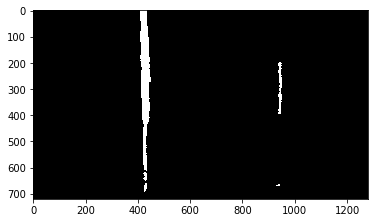

In [76]:
image = cv2.imread("test_images/test4.jpg") 
ret, mtx, dist, rvecs, tvecs = undistort_init()
undist = undistort(image, ret, mtx, dist, rvecs, tvecs)
M, Minv, warped = warp(undist)
warped = cv2.cvtColor(warped, cv2.COLOR_BGR2RGB)

hls_saturation = hls_select(warped, 'saturation', thresh=(130, 255))
hsv_value = hsv_select(warped, 'value', thresh=(225, 255))


comb = np.zeros_like(hsv_value)
comb[(hsv_value == 1) & (hls_saturation == 1)] = 1

plt.imshow(comb, cmap='gray')
plt.show()

test2.jpg


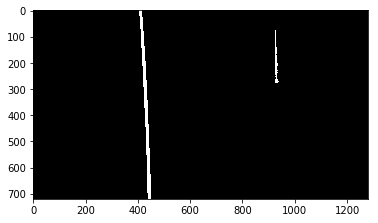

test4.jpg


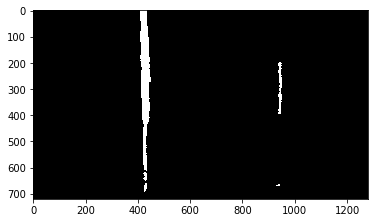

straight_lines2.jpg


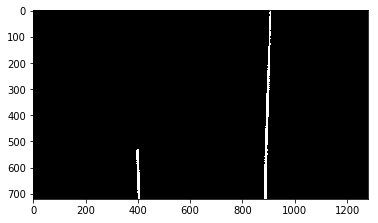

test6.jpg


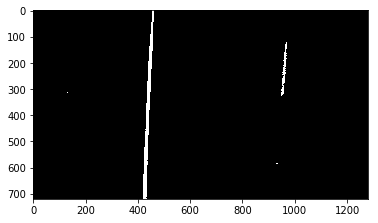

straight_lines1.jpg


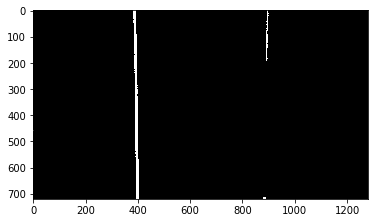

test1.jpg


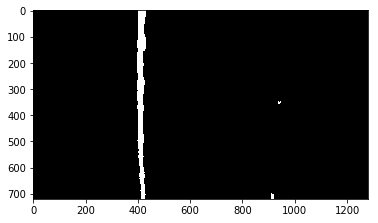

test5.jpg


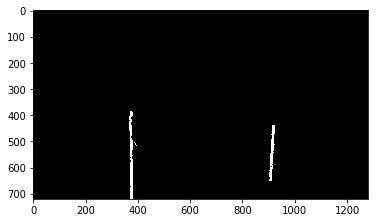

test3.jpg


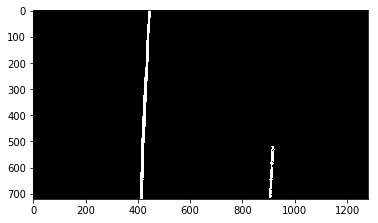

In [44]:
# Test on all test images
test_images = os.listdir("test_images/")
ret, mtx, dist, rvecs, tvecs = undistort_init()

for image_file in test_images:
    image = cv2.imread(os.path.join("test_images", image_file)) 
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    undist = undistort(image, ret, mtx, dist, rvecs, tvecs)
    M, Minv, warped = warp(undist)

    hls_saturation = hls_select(warped, 'saturation', thresh=(130, 255))
    hsv_value = hsv_select(warped, 'value', thresh=(225, 255))


    comb = np.zeros_like(hsv_value)
    comb[(hsv_value == 1) & (hls_saturation == 1)] = 1
    
    print(image_file)
    plt.imshow(comb, cmap='gray')
    plt.show()

#### 4. Describe how (and identify where in your code) you identified lane-line pixels and fit their positions with a polynomial?

I used the sliding window approach to find the lane-lines on a binary image. 

In [80]:
def line_fitting(binary_warped):
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    out_img = np.uint8(np.dstack((binary_warped, binary_warped, binary_warped))*255)
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    nwindows = 9
    window_height = np.int(binary_warped.shape[0]/nwindows)
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    leftx_current = leftx_base
    rightx_current = rightx_base
    margin = 100
    minpix = 50
    left_lane_inds = []
    right_lane_inds = []

    for window in range(nwindows):
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin        
        
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)

        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 
    
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )    
    
    # Here I fit the lane-line pixels with the polynomial
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    return out_img, left_fitx, right_fitx, ploty

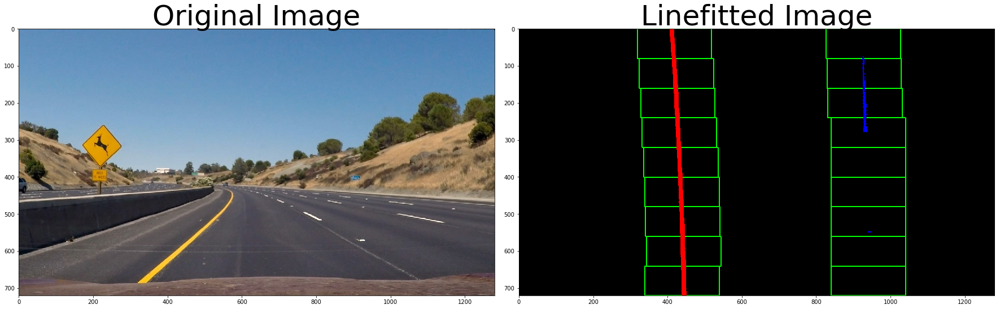

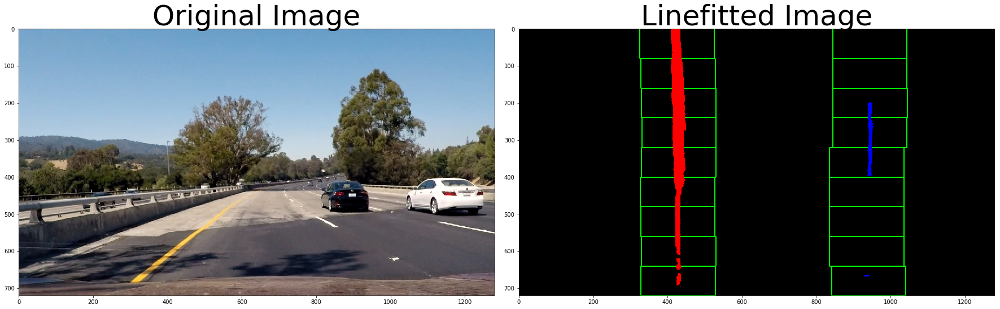

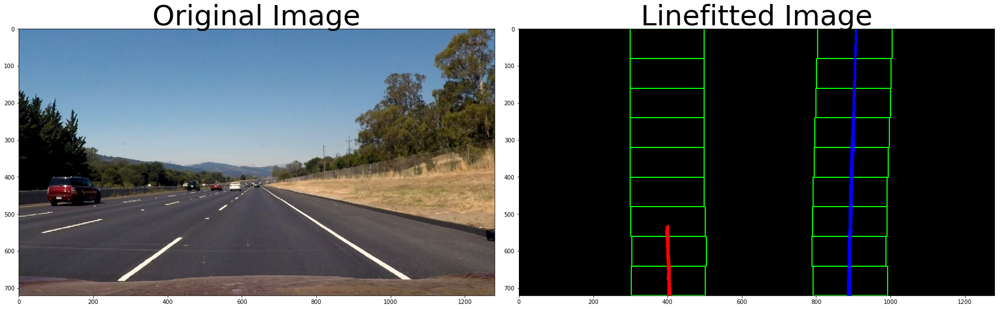

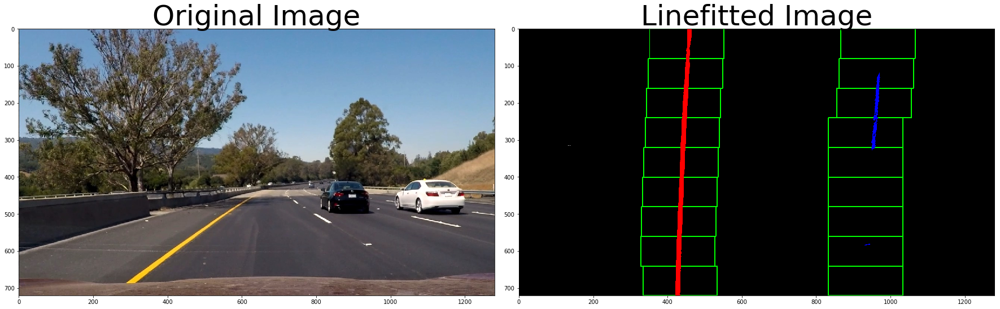

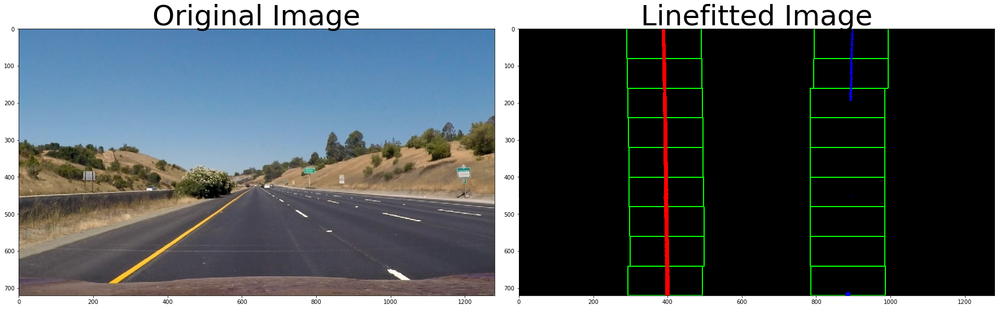

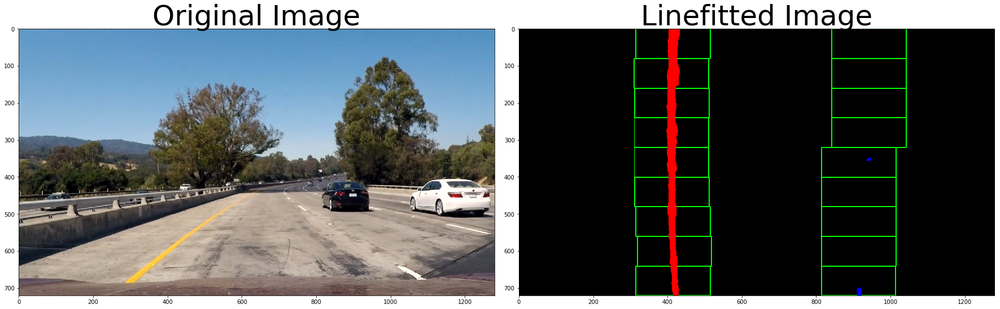

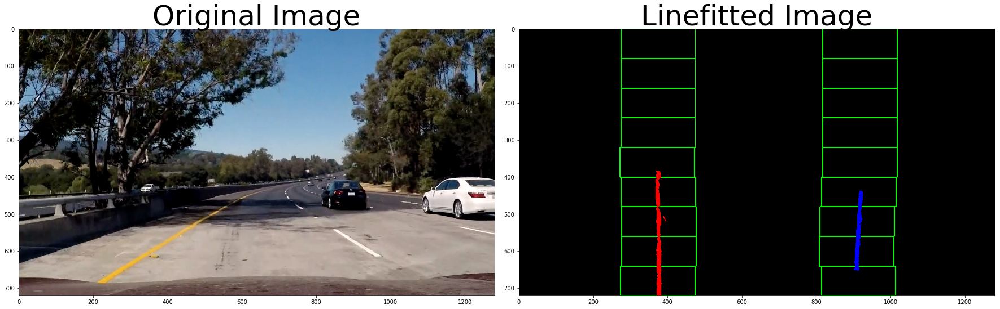

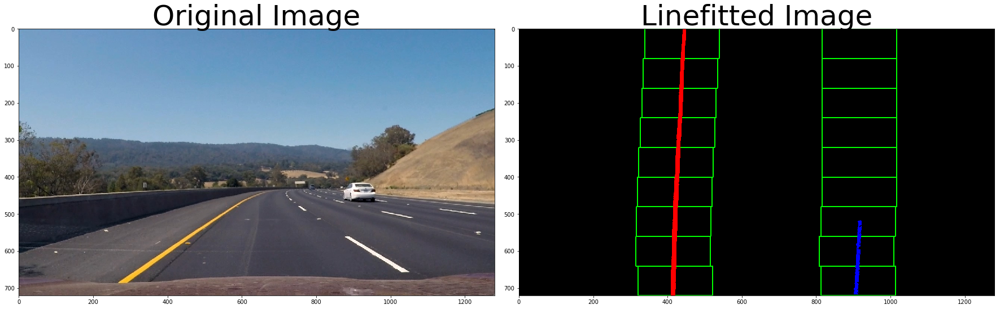

In [81]:
# Test on all test images
test_images = os.listdir("test_images/")
ret, mtx, dist, rvecs, tvecs = undistort_init()

for image_file in test_images:
    image = cv2.imread(os.path.join("test_images", image_file)) 
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    undist = undistort(image, ret, mtx, dist, rvecs, tvecs)    
    M, Minv, warped = warp(undist)

    hls_saturation = hls_select(warped, 'saturation', thresh=(130, 255))
    hsv_value = hsv_select(warped, 'value', thresh=(225, 255))


    comb = np.zeros_like(hsv_value)
    comb[(hsv_value == 1) & (hls_saturation == 1)] = 1
    
    line_fitted, left_fit, right_fit, ploty = line_fitting(comb)

    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(line_fitted)
    ax2.set_title('Linefitted Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.show()

In [64]:
#def continous_line_fitting(left_fit, right_fit):
#    nonzero = binary_warped.nonzero()
#    nonzeroy = np.array(nonzero[0])
#    nonzerox = np.array(nonzero[1])#
#    margin = 100
#    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
#    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  #
#
#    # Again, extract left and right line pixel positions
#    leftx = nonzerox[left_lane_inds]
#    lefty = nonzeroy[left_lane_inds] 
#    rightx = nonzerox[right_lane_inds]
#    righty = nonzeroy[right_lane_inds]
#    # Fit a second order polynomial to each
#    left_fit = np.polyfit(lefty, leftx, 2)
#    right_fit = np.polyfit(righty, rightx, 2)
#    # Generate x and y values for plotting
#    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
#    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
#    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
#    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
#    window_img = np.zeros_like(out_img)
#    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
#    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
#    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
#    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
#    left_line_pts = np.hstack((left_line_window1, left_line_window2))
#    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
#    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
#    right_line_pts = np.hstack((right_line_window1, right_line_window2))
   
#    return out_img, left_fit, right_fit, leftx, rightx


#image = cv2.imread("test_images/test4.jpg") 
#ret, mtx, dist, rvecs, tvecs = undistort_init()
#undist = undistort(image, ret, mtx, dist, rvecs, tvecs)
#M, Minv, warped = warp(undist)
#warped = cv2.cvtColor(warped, cv2.COLOR_BGR2RGB)

#hls_lightness = hls_select(warped, 'lightness', thresh=(180, 255))
#hsv_value = hsv_select(warped, 'value', thresh=(200, 255))
#hls_saturation = hls_select(warped, 'saturation', thresh=(120, 255))


#binary_warped = np.zeros_like(hsv_value)
#binary_warped[((hsv_value == 1) | (hls_lightness == 1)) & (hls_saturation == 1)] = 1

#out_img, left_fit, right_fit, leftx, rightx = line_fitting(binary_warped)
#out_img, left_fit, right_fit, leftx, right = continous_line_fitting(left_fit, right_fit)





#cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
#cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
#result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
#plt.imshow(result)
#plt.plot(left_fitx, ploty, color='yellow')
#plt.plot(right_fitx, ploty, color='yellow')
#plt.xlim(0, 1280)
#plt.ylim(720, 0)


#### 5. Describe how (and identify where in your code) you calculated the radius of curvature of the lane and the position of the vehicle with respect to center.

I used the measure_curvature_pixels() function to calculate the curvature of the lane.

In [50]:
def measure_curvature_pixels(ploty, left_fit, right_fit):
    y_eval = np.max(ploty)    
    left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    
    return left_curverad, right_curverad

def find_pos(left_fit, right_fit, width):
    xm_per_pix = 3.7/700 
    car_position = width / 2
    left_fit_x_pol = left_fit[0]*h**2 + left_fit[1]*h + left_fit[2]
    right_fit_x_pol = right_fit[0]*h**2 + right_fit[1]*h + right_fit[2]
    lane_center_position = (left_fit_x_pol + right_fit_x_pol) /2
    center_distance = (car_position - lane_center_position) * xm_per_pix
    return center_distance

def plot_lane(binary_warped, undist, Minv, ploty, left_fitx, right_fitx):
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    return result    

#### 6. Provide an example image of your result plotted back down onto the road such that the lane area is identified clearly.

Here is an example of my result on all test image:

2.51182249419e+14
1.27161498742e+15
-1830811.82029


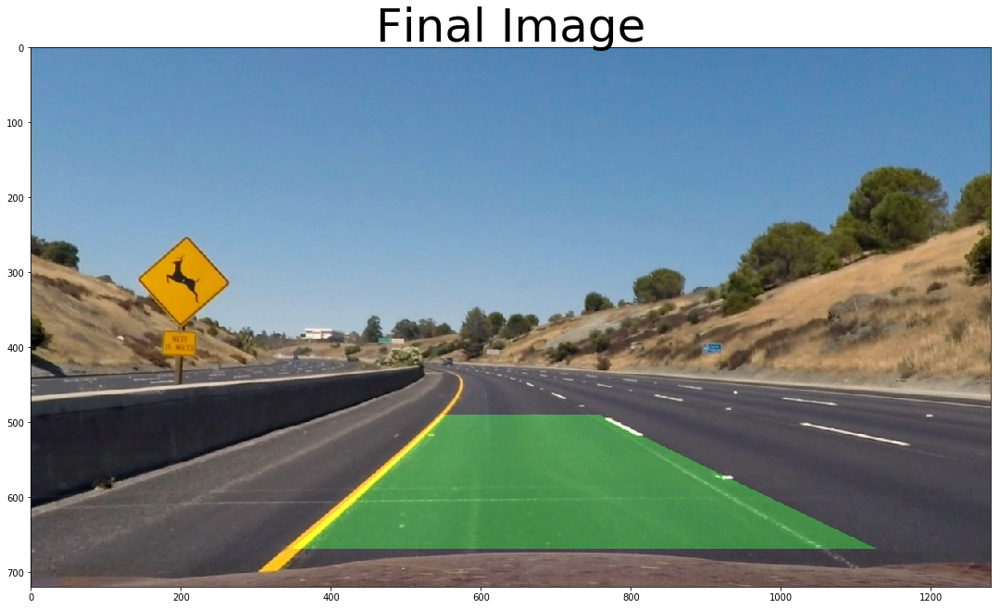

2.64726627183e+14
1.3142454003e+15
-1866871.30316


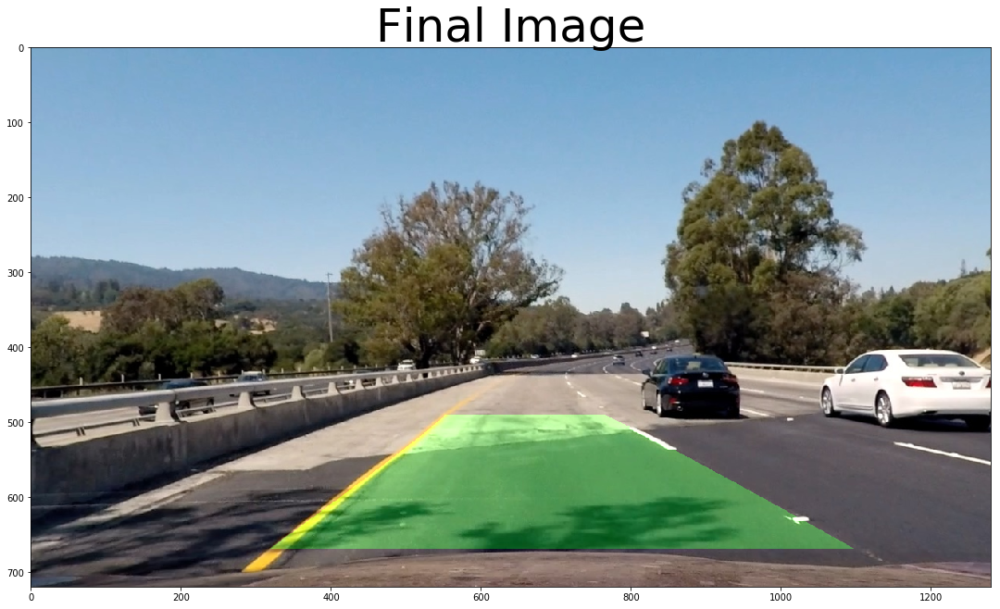

2.12758463153e+14
1.22614537305e+15
-1763070.62507


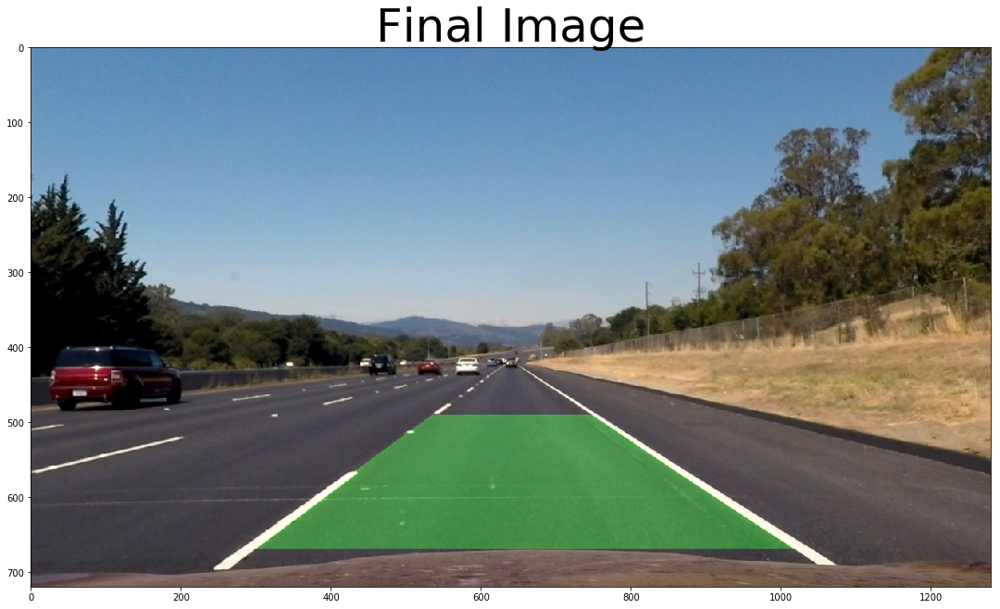

3.13755085649e+14
1.42284122969e+15
-1970331.07019


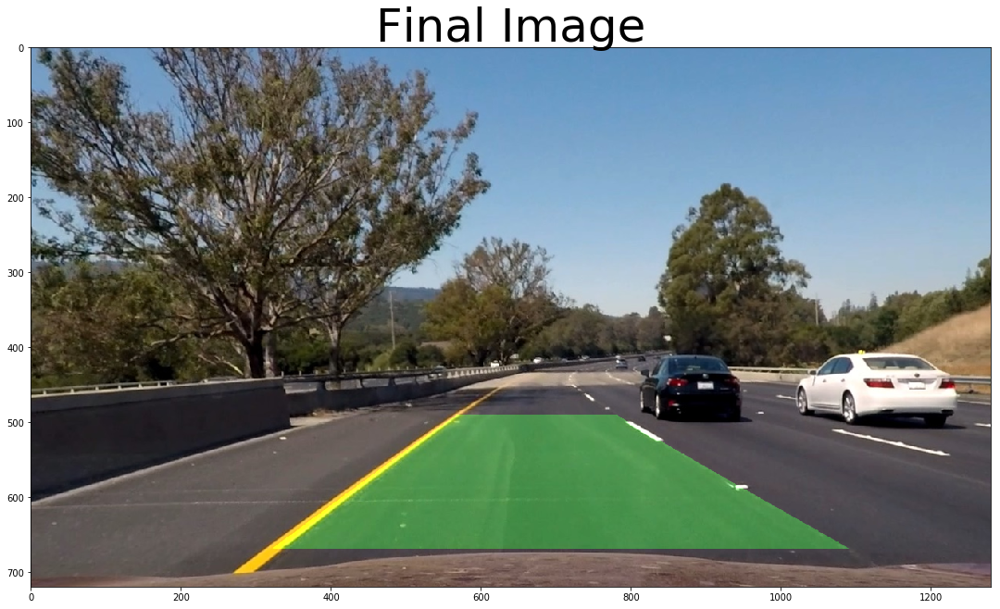

2.24766852147e+14
1.19719836902e+15
-1762721.57566


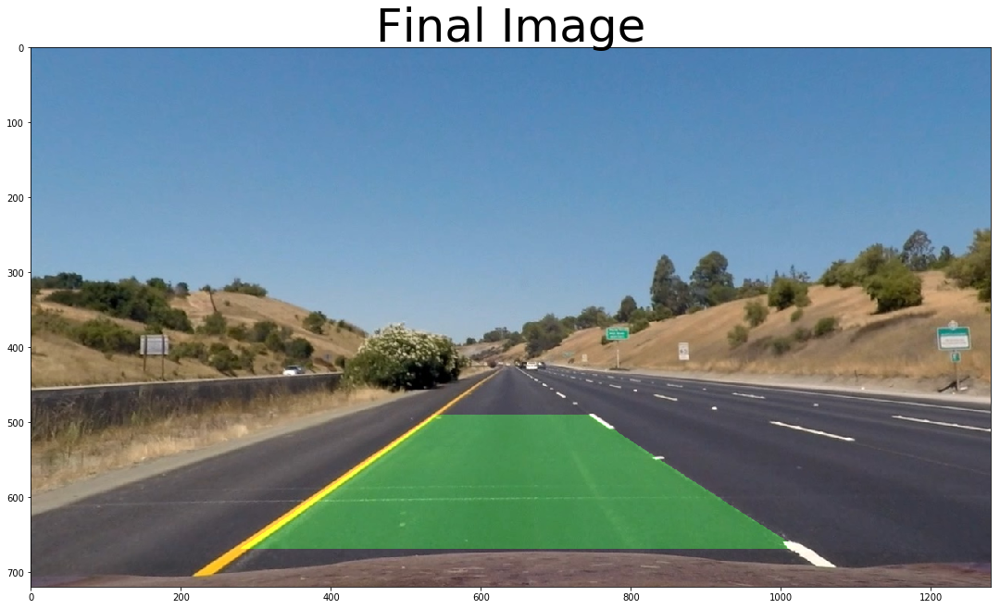

2.59029056534e+14
1.6650191426e+15
-2022414.38614


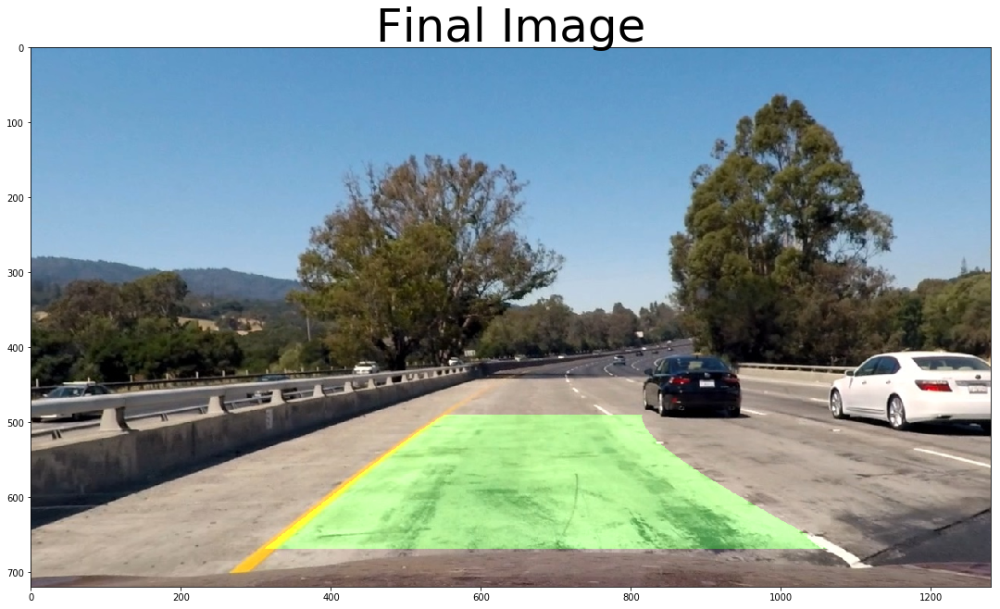

1.84754595028e+14
1.36611065704e+15
-1796865.09926


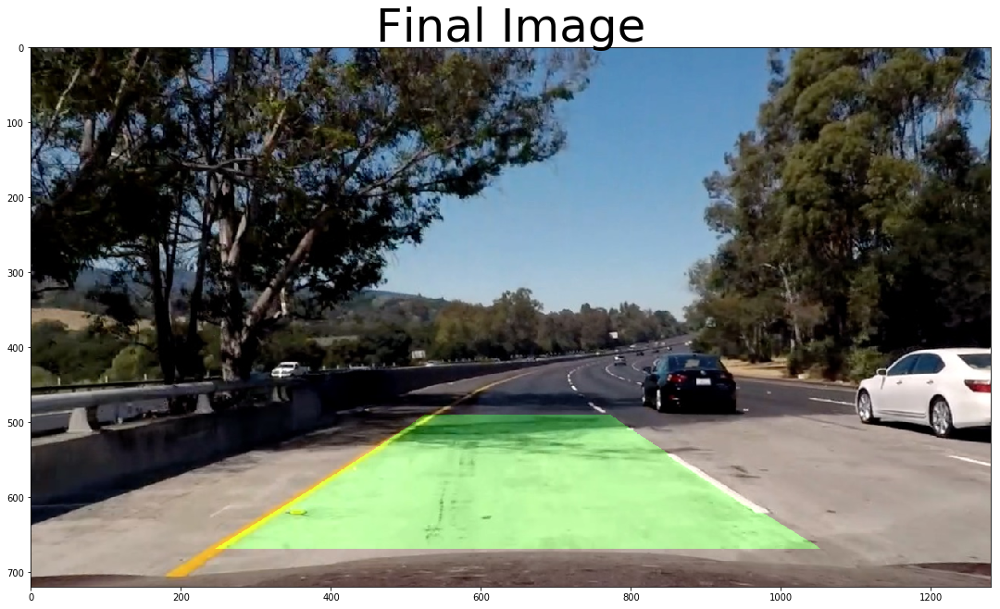

2.95348730175e+14
1.33149007279e+15
-1907830.56826


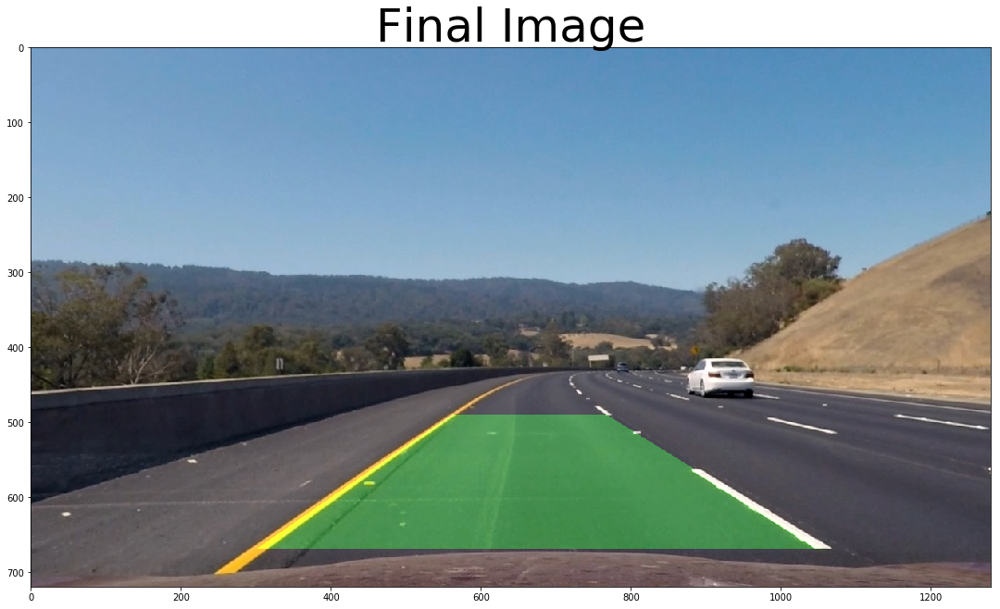

In [52]:
# Test on all test images
test_images = os.listdir("test_images/")
ret, mtx, dist, rvecs, tvecs = undistort_init()

for image_file in test_images:
    image = cv2.imread(os.path.join("test_images", image_file)) 
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    undist = undistort(image, ret, mtx, dist, rvecs, tvecs)    
    M, Minv, warped = warp(undist)

    hls_saturation = hls_select(warped, 'saturation', thresh=(130, 255))
    hsv_value = hsv_select(warped, 'value', thresh=(225, 255))


    comb = np.zeros_like(hsv_value)
    comb[(hsv_value == 1) & (hls_saturation == 1)] = 1
    
    line_fitted, left_fit, right_fit, ploty = line_fitting(comb)
    
    left_curverad, right_curverad = measure_curvature_pixels(ploty, left_fit, right_fit)
    print(left_curverad)
    print(right_curverad)
    
    position = find_pos(left_fit, right_fit, comb.shape[1])
    print(position)
    
    final_image = plot_lane(comb, undist, Minv, ploty, left_fit, right_fit)
    
    f, (ax1) = plt.subplots(1, 1, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(final_image)
    ax1.set_title('Final Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.show()

### Pipeline (video)

#### 1. Provide a link to your final video output.  Your pipeline should perform reasonably well on the entire project video (wobbly lines are ok but no catastrophic failures that would cause the car to drive off the road!).

In [53]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None  

current_line = Line()

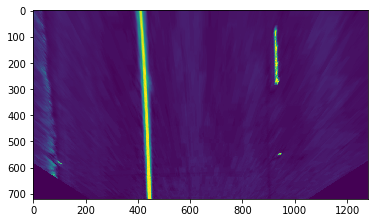

In [225]:
def process_image(image):
    # image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    undist = undistort(image, ret, mtx, dist, rvecs, tvecs)
    M, Minv, warped = warp(undist)
    
    hls_saturation = hls_select(warped, thresh=(0, 255))
    hsv_value = hsv_select(warped, thresh=(225, 255))


    comb = np.zeros_like(hsv_value)
    comb[(hsv_value == 1) & (hls_saturation == 1)] = 1
    combined = np.zeros_like(dir_binary_blue)
    combined[((grad_binary_x_blue == 1) & (grad_binary_y_blue == 1)) | ((mag_binary_blue == 1) & (dir_binary_blue == 1))] = 1
    
    
    # line_fitted, left_fit, right_fit, ploty = line_fitting(comb)    
    # final_image = plot_lane(comb, undist, Minv, ploty, left_fit, right_fit)
    dsp = cv2.cvtColor(undist, cv2.COLOR_RGB2HLS)
    gray = dsp[:,:,2]
    
    M, Minv, warped = warp(gray)
    
    return warped

image = cv2.imread("test_images/test2.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(process_image(image))

In [226]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

left_lane = Line()
right_lane = Line()
ret, mtx, dist, rvecs, tvecs = undistort_init()

video_output1 = 'project_video_output.mp4'
video_input1 = VideoFileClip('project_video.mp4').subclip(1,3)
processed_video = video_input1.fl_image(process_image)
%time processed_video.write_videofile(video_output1, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4








  0%|          | 0/51 [00:00<?, ?it/s]





  2%|▏         | 1/51 [00:00<00:06,  8.15it/s]





  4%|▍         | 2/51 [00:00<00:06,  7.67it/s]





  6%|▌         | 3/51 [00:00<00:06,  7.39it/s]





  8%|▊         | 4/51 [00:00<00:06,  7.04it/s]





 10%|▉         | 5/51 [00:00<00:06,  6.95it/s]





 12%|█▏        | 6/51 [00:00<00:06,  6.98it/s]





 14%|█▎        | 7/51 [00:01<00:06,  7.14it/s]





 16%|█▌        | 8/51 [00:01<00:06,  6.97it/s]





 18%|█▊        | 9/51 [00:01<00:05,  7.15it/s]





 20%|█▉        | 10/51 [00:01<00:05,  7.69it/s]





 22%|██▏       | 11/51 [00:01<00:05,  7.81it/s]





 24%|██▎       | 12/51 [00:01<00:05,  7.77it/s]





 25%|██▌       | 13/51 [00:01<00:04,  7.75it/s]





 27%|██▋       | 14/51 [00:01<00:04,  7.75it/s]





 29%|██▉       | 15/51 [00:02<00:04,  7.49it/s]





 31%|███▏      | 16/51 [00:02<00:04,  7.68it/s]





 33%|███▎      | 17/51 [00:02<00:04,  7.65it/s]





 35%|███▌      | 18/51 [00:02<00:04,  7.49it/s]





 39%|

[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 2.64 s, sys: 37.3 ms, total: 2.67 s
Wall time: 7.25 s
